<a href="https://colab.research.google.com/github/anyakdard/ocean-acoustics/blob/main/first_play_around.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

1st notebook. Getting to grips with librosa, loading some sounds, making waveforms and spectrograms.

In [1]:
print("hello")

hello


In [2]:
# Install librosa (audio analysis library)
!pip install librosa

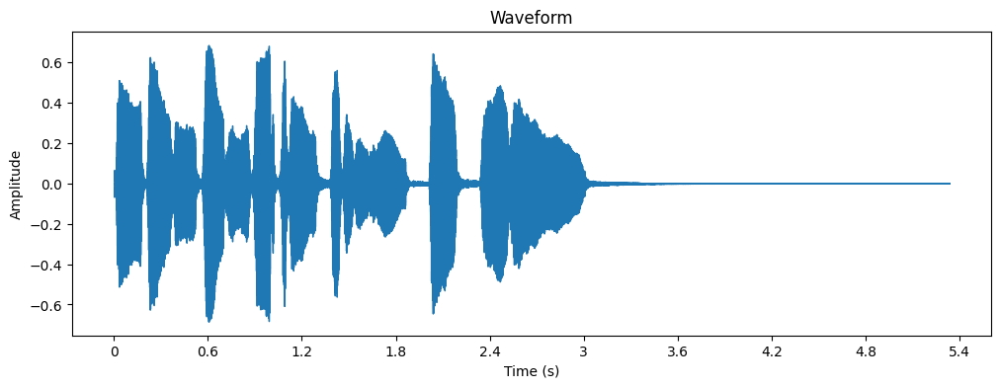

In [3]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

# load sample audio file built in from librosa
y, sr = librosa.load(librosa.ex('trumpet'))

# plot waveform
plt.figure(figsize=(12,4))
librosa.display.waveshow(y, sr=sr)
plt.title('Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

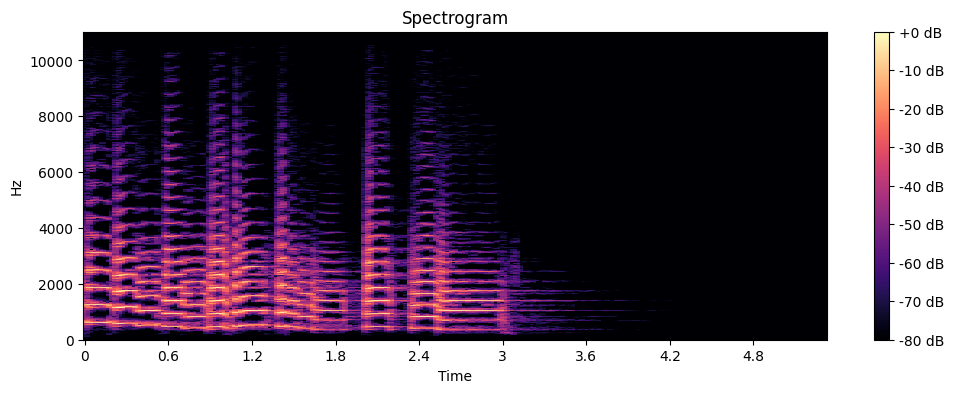

In [5]:
# plot spectrogram
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)

plt.figure(figsize=(12, 4))
librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram')
plt.show()

In [6]:
from IPython.display import Audio
Audio(y, rate=sr)

In [10]:
!wget -q "https://archive.org/download/KillerWhaleorcinusOrcaSoundsVocalizations/KillerWhale.mp3" -O orca.mp3

import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import Audio

# Load file
y, sr = librosa.load('orca.mp3')

# Listen
Audio(y, rate=sr)

/tmp/ipykernel_5336/1369675165.py:10: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load('orca.mp3')


EOFError: 

In [8]:
# Check if the file downloaded
import os
print(os.path.exists('orca.mp3'))
print(os.listdir('.'))

True
['.config', 'orca.mp3', 'sample_data']


In [9]:
y, sr = librosa.load('orca.mp3')
Audio(y, rate=sr)

/tmp/ipykernel_5336/3968116933.py:1: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load('orca.mp3')


EOFError: 

In [11]:
# Check the file size - if it's tiny, it's corrupted
print(os.path.getsize('orca.mp3'), 'bytes')

0 bytes


In [12]:
import urllib.request

url = "https://www.soundjay.com/nature/sounds/ocean-wave-1.wav"

# Try this NPS orca recording instead
urllib.request.urlretrieve(
    "https://dosits.org/wp-content/uploads/2019/10/killerwhale_orca_pulsedcalls_uwa.mp3",
    "orca.mp3"
)

print(os.path.getsize('orca.mp3'), 'bytes')

HTTPError: HTTP Error 403: Forbidden

In [1]:
import urllib.request

urllib.request.urlretrieve(
    "https://github.com/patriceguyot/Acoustic_Indices/raw/master/test_audio/S4A03902_20171219_000000.wav",
    "soundscape.wav"
)

print(os.path.getsize('soundscape.wav'), 'bytes')

HTTPError: HTTP Error 404: Not Found

In [6]:


import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import Audio

# Replace 'orca.wav' with whatever the file is actually called
y, sr = librosa.load('sample_data/797762__raiden04__humpback_whales_and_orcas_ambient_underwater_recording.wav')

Audio(y, rate=sr)

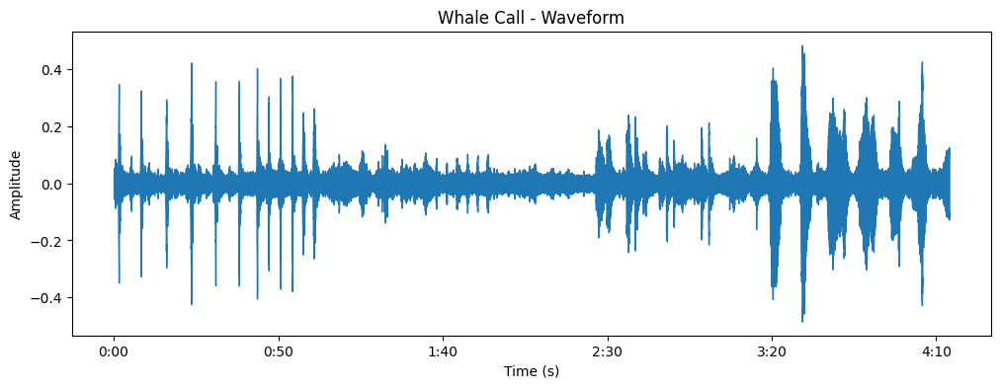

In [7]:
# waveform

plt.figure(figsize=(12,4))
librosa.display.waveshow(y, sr=sr)
plt.title('Whale Call - Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

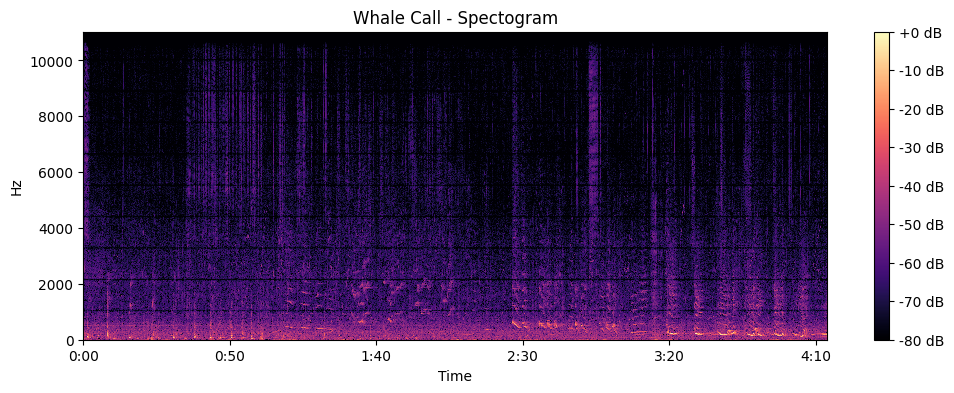

In [8]:
# spectogram

D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)

plt.figure(figsize=(12,4))
librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar(format='%+2.0f dB')
plt.title('Whale Call - Spectogram')
plt.show()

In [1]:
# trying mel spectogram
M = librosa.feature.melspectrogram(y=y, sr=sr)
M_db = librosa.amplitude_to_db(M, ref=np.max)

plt.figure(figsize=(12,4))
librosa.display.specshow(M_db, sr=sr, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title('Mel Spectrogram')
plt.show()

NameError: name 'librosa' is not defined

In [9]:
# Install AWS CLI tool in Colab.
# Command line tool to connect to S3 buckets
# ! for running as a terminal command (not python)

!pip install awscli

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 48.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.0/15.0 MB 95.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 570.5/570.5 kB 40.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 7.8 MB/s eta 0:00:00
  Attempting uninstall: rsa
    Found existing installation: rsa 4.9.1
    Uninstalling rsa-4.9.1:
      Successfully uninstalled rsa-4.9.1
  Attempting uninstall: docutils
    Found existing installation: docutils 0.21.2
    Uninstalling docutils-0.21.2:
      Successfully uninstalled docutils-0.21.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
sphinx 8.2.3 requires docutils<0.22,>=0.20, but you have docutils 0.19 which is incompatible.


In [6]:
!aws --version

aws-cli/1.45.9 Python/3.12.13 Linux/6.6.122+ botocore/1.43.9


In [7]:
# seeing what there is in public s3 bucket
!aws s3 ls s3://acoustic-sandbox/detections/ --no-sign-request
# this didn't work so cloning a repository with sounds instead

In [5]:
# cloning OrcaSound machine learning repo
!git clone https://github.com/orcasound/orcaml

Cloning into 'orcaml'...
remote: Enumerating objects: 102, done.
remote: Counting objects: 100% (102/102), done.
remote: Compressing objects: 100% (54/54), done.
remote: Total 102 (delta 47), reused 96 (delta 43), pack-reused 0 (from 0)
Receiving objects: 100% (102/102), 734.41 KiB | 12.88 MiB/s, done.
Resolving deltas: 100% (47/47), done.


In [6]:
# running their official download script and grabbing labelled training data
# it's 10GB so only grabbing a small test set
!python ./orcaml/data_ml/tools/download_datasets.py /content/orcadata --only_test

sh: 1: aws: not found
Traceback (most recent call last):
  File "/content/./orcaml/data_ml/tools/download_datasets.py", line 118, in <module>
    dataset_archive = aws_download(combined_test_dataset, args.download_dir)
                      ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/content/./orcaml/data_ml/tools/download_datasets.py", line 20, in aws_download
    raise RuntimeError("{} does not exist".format(full_path_to_filename))
RuntimeError: /content/orcadata/TestDataLatest_PodCastAllRounds_123.tar.gz does not exist


In [11]:
# that downloaded but couldn't find the file
# instead gonna extract it myself manually

import os

# os.listdir() is like opening a folder and seeing what's inside

os.listdir('/content/orcadata')

NotADirectoryError: [Errno 20] Not a directory: '/content/orcadata'

In [7]:
# didn't work - finding where it actually saved to

!find / -name "*.tar.gz" 2>/dev/null

/root/.julia/registries/General.tar.gz
/usr/share/doc/r-cran-rcmdcheck/tests/testthat/fixtures/badpackage_1.0.0.tar.gz
/usr/share/doc/r-cran-rcmdcheck/tests/testthat/fixtures/bad-tests.tar.gz
/usr/local/share/julia/stdlib/v1.12/Pkg/test/resolvedata.tar.gz
/usr/local/lib/python3.12/dist-packages/dateutil/zoneinfo/dateutil-zoneinfo.tar.gz
/usr/local/lib/python3.12/dist-packages/pooch/tests/data/store.tar.gz
/usr/local/lib/python3.12/dist-packages/pooch/tests/data/tiny-data.tar.gz
/usr/lib/R/site-library/vroom/extdata/mtcars.csv.tar.gz
/usr/lib/R/site-library/pak/tools/xxx.tar.gz
/usr/lib/R/site-library/pak/library/pkgdepends/tools/xxx.tar.gz


In [10]:
# the download didn't work so next time do this:

# Download the test dataset directly from the S3 bucket
# This is the same file the script was trying to get, just done manually
!aws s3 cp s3://acoustic-sandbox/labeled-data/detection/train/TestDataLatest_PodCastAllRounds_123.tar.gz /content/orcadata.tar.gz --no-sign-request

download: s3://acoustic-sandbox/labeled-data/detection/train/TestDataLatest_PodCastAllRounds_123.tar.gz to ./orcadata.tar.gz


In [11]:
# check it arrived

import os
print(os.path.getsize('/content/orcadata.tar.gz'), 'bytes')

1075749718 bytes


In [12]:
import tarfile

# make the directory we want

os.makedirs('/content/orcadata', exist_ok=True)

# this is python's way of opening .tar.gz files
# these tar files are like zip files (compressed archive containing archived files)

with tarfile.open('/content/orcadata.tar.gz', 'r:gz') as tar:
  tar.extractall('/content/orcadata')

print('Done extracting')

/tmp/ipykernel_3677/2150331937.py:11: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall('/content/orcadata')


Done extracting


In [17]:
# the above didn't work because it exists but not as a folder
# so just redoing it all to the way I want

# Remove whatever is currently at that path and start fresh
!rm -rf /content/orcadata
!mkdir /content/orcadata
!tar -xzf /content/orcadata.tar.gz -C /content/orcadata
print('Done!')

Done!


In [13]:
import os

for root, dirs, files in os.walk('/content/orcadata'):
    level = root.replace('/content/orcadata', '').count(os.sep)
    if level < 3:
        indent = ' ' * 2 * level
        print(f'{indent}{os.path.basename(root)}/')
        if level < 2:
            subindent = ' ' * 2 * (level + 1)
            for file in files[:5]:
                print(f'{subindent}{file}')

orcadata/
  .DS_Store
  test.tsv
  wav/
    streaming-orcasound-net_2019_11_14_13_02_00.wav
    streaming-orcasound-net_2019_11_14_13_20_00.wav
    streaming-orcasound-net_2019_11_14_13_27_00.wav
    streaming-orcasound-net_2019_11_14_13_30_00.wav
    OS_9_27_2017_08_25_00__0003.wav


In [14]:
# look at labels file first

import pandas as pd

# pd.read_csv reads csv files as a data frame

df = pd.read_csv('/content/orcadata/test.tsv', sep='\t')
# columns separated by tabs (hence tsv)

print(df.head(10))
print('\nColumns', df.columns.tolist())
print('total rows', len(df)) # length of dataframe as total rows

               dataset                wav_filename  start_time_s  duration_s  \
0  podcast_test_round1  OS_7_05_2019_08_24_00_.wav        52.172       1.118   
1  podcast_test_round1  OS_7_05_2019_08_24_00_.wav        54.877       1.104   
2  podcast_test_round1  OS_7_05_2019_08_24_00_.wav        69.701       2.691   
3  podcast_test_round1  OS_7_05_2019_08_24_00_.wav        72.765       0.795   
4  podcast_test_round1  OS_7_05_2019_08_24_00_.wav        73.510       0.925   
5  podcast_test_round1  OS_7_05_2019_08_24_00_.wav        75.111       1.367   
6  podcast_test_round1  OS_7_05_2019_08_24_00_.wav        78.934       1.810   
7  podcast_test_round1  OS_7_05_2019_08_24_00_.wav        80.744       1.241   
8  podcast_test_round1  OS_7_05_2019_08_24_00_.wav        82.882       1.145   
9  podcast_test_round1  OS_7_05_2019_08_24_00_.wav        85.684       7.839   

        location        date pst_or_master_tape_identifier  
0  orcasound_lab  1562340736    OS_7_05_2019_08_24_00_.wav

In [16]:
# loading one of those files to listen to the orca call

import librosa
import numpy as np
from IPython.display import Audio

#just checking if the first .wav file is in my /wav folder
wav_path = '/content/orcadata/wav/OS_7_05_2019_08_24_00_.wav'

# checking if path exists
print(os.path.exists(wav_path))

True


In [17]:
# loading wav file
# use timestamps from labels

y_call, sr_call = librosa.load(wav_path, offset=52.172, duration=1.118)

Audio(y_call, rate=sr_call)

# btw y_call is the audio data. An array of numbers representing the amplitude of the sound wave
# sr_call is the sample rate - so how many measurements per second were taken
# just naming these different things to before so I don't overwrite the freesound data from earlier


In [25]:
# gonna relisten with a bit longer to distinguish the sound

y_call, sr_call = librosa.load(wav_path, offset=51, duration=5)

Audio(y_call, rate=sr_call)

In [27]:
# plot spectrogram for sound
import matplotlib as plt

D = librosa.amplitude_to_db(np.abs(librosa.stft(y_call)), ref=np.max)

plt.figure(figsize=(10,4))
librosa.display.specshow(D, sr=sr_call, x_axis='time', y_axis='hz')
plt.colorbar(format='%+2.0f dB')
plt.title('Orca Call - Row 0 - 51 seconds - 56 seconds')
plt.show()



TypeError: 'module' object is not callable

In [28]:
# Force reimport matplotlib cleanly bc something is overwriting it
import importlib
import matplotlib
importlib.reload(matplotlib)
import matplotlib.pyplot as plt

# Confirm it worked
print(type(plt))

<class 'module'>


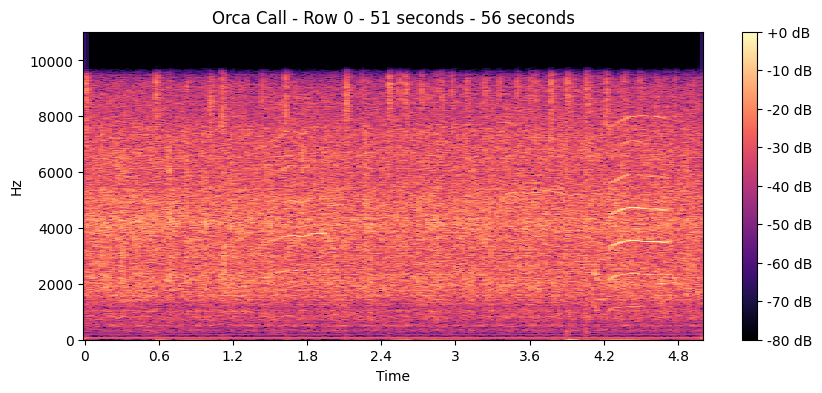

In [30]:
# plot spectrogram for sound
import matplotlib.pyplot as plt

D = librosa.amplitude_to_db(np.abs(librosa.stft(y_call)), ref=np.max)

plt.figure(figsize=(10,4))
librosa.display.specshow(D, sr=sr_call, x_axis='time', y_axis='hz')
plt.colorbar(format='%+2.0f dB')
plt.title('Orca Call - Row 0 - 51 seconds - 56 seconds')
plt.show()



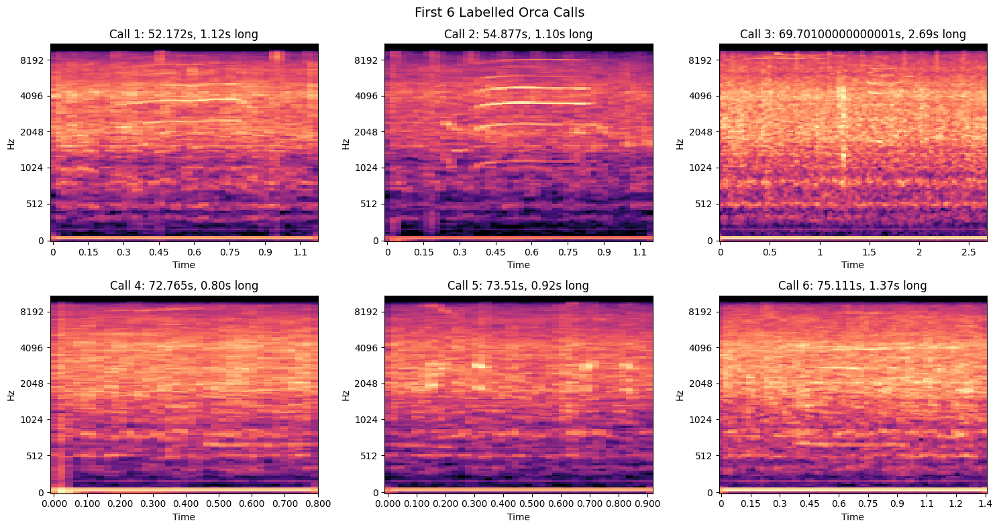

In [18]:
# Plot the first 6 labelled calls side by side to compare them visually
# give intuition for what orca calls look like as a pattern

import matplotlib.pyplot as plt


fig, axes = plt.subplots(2, 3, figsize=(15, 8))
# plt.subplots creates a grid of plots
# 2, 3 means 2 rows and 3 columns = 6 plots total
# axes is the array of individual plot panels

axes = axes.flatten()
# flatten() converts the 2D grid of axes into a simple list so we can loop through them

for i in range(6):
    row = df.iloc[i]
    # df.iloc[i] gets row i from our labels dataframe
    # iloc stands for "integer location" - get row by its position number

    wav_path = f'/content/orcadata/wav/{row["wav_filename"]}'

    # Load just that specific call using its timestamp
    y_snippet, sr_snippet = librosa.load(wav_path,
                                          offset=row['start_time_s'],
                                          duration=row['duration_s'])

    # Generate mel spectrogram for each call
    M = librosa.feature.melspectrogram(y=y_snippet, sr=sr_snippet)
    M_db = librosa.amplitude_to_db(M, ref=np.max)

    # Plot into the correct panel
    librosa.display.specshow(M_db, sr=sr_snippet, ax=axes[i],
                             x_axis='time', y_axis='mel')
    axes[i].set_title(f'Call {i+1}: {row["start_time_s"]}s, {row["duration_s"]:.2f}s long')

plt.suptitle('First 6 Labelled Orca Calls', fontsize=14)
# suptitle adds a title above the whole grid of plots
plt.tight_layout()
# tight_layout stops the plots overlapping each other
plt.show()